# Cross species clustering and cluster assignation

In [1]:
import numpy as np
from scipy.cluster import hierarchy
import matplotlib.pyplot as plt
import scanpy as sc
from sklearn.metrics import silhouette_score
from sklearn.model_selection import train_test_split

In [ ]:
# Load annotated_data
data = sc.read_h5ad("data/annotated_data/cross_species_all_sets.h5ad")

In [3]:
data.obs['orig.ident'].value_counts()

orig.ident
KNAF12_Humain-P11_NeuN_180325    8688
GSM7474503                       6784
KNAF14                           6039
KNAF8                            4306
GSE7474501                       4260
ZHANG                            3663
YADAV                            3555
KNAF3                            3265
KNAF11                           2598
KNAF9                            2354
KATHE                            2331
MATSON                           2305
KNAF4                            1820
KNAF10                           1682
BOUV5                            1417
Name: count, dtype: int64

In [4]:
data.obs['predicted_annotation'].groupby(data.obs['orig.ident']).value_counts()

C:\Users\Emile\AppData\Local\Temp\ipykernel_24004\724929743.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  data.obs['predicted_annotation'].groupby(data.obs['orig.ident']).value_counts()


orig.ident                     predicted_annotation
BOUV5                          Not_V1_predicted        1385
                               V1_predicted              32
GSE7474501                     Not_V1_predicted        3907
                               V1_predicted             353
GSM7474503                     Not_V1_predicted        6535
                               V1_predicted             249
KATHE                          Not_V1_predicted        2200
                               V1_predicted             131
KNAF3                          Not_V1_predicted        3142
                               V1_predicted             123
KNAF4                          V1_predicted            1776
                               Not_V1_predicted          44
KNAF8                          Not_V1_predicted        4246
                               V1_predicted              60
KNAF9                          Not_V1_predicted        2297
                               V1_predicted     

In [5]:
V1 = data[data.obs['predicted_annotation'] == 'V1_predicted']
V1.obs['orig.ident'].value_counts()

orig.ident
KNAF14                           2077
KNAF4                            1776
GSE7474501                        353
KNAF12_Humain-P11_NeuN_180325     333
GSM7474503                        249
KATHE                             131
KNAF3                             123
MATSON                            119
KNAF11                             82
KNAF8                              60
KNAF9                              57
YADAV                              44
KNAF10                             36
BOUV5                              32
ZHANG                              32
Name: count, dtype: int64

In [6]:
V1.obs['species'].value_counts()

species
mouse    4860
human     644
Name: count, dtype: int64

In [7]:
del data

## Data exploration and clustering

In [8]:
sc.neighbors.neighbors(V1, use_rep='X_rpca')

In [ ]:
# Compute pca and umap representations
sc.tl.pca(V1)
sc.tl.umap(V1)

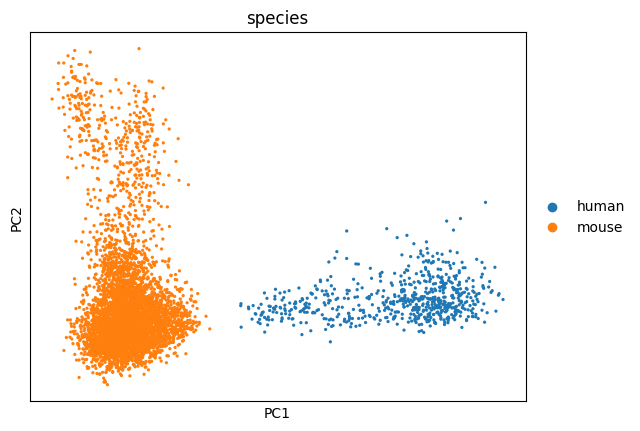

In [ ]:
sc.pl.pca(V1, color = 'species')
# The pca seperates species very well

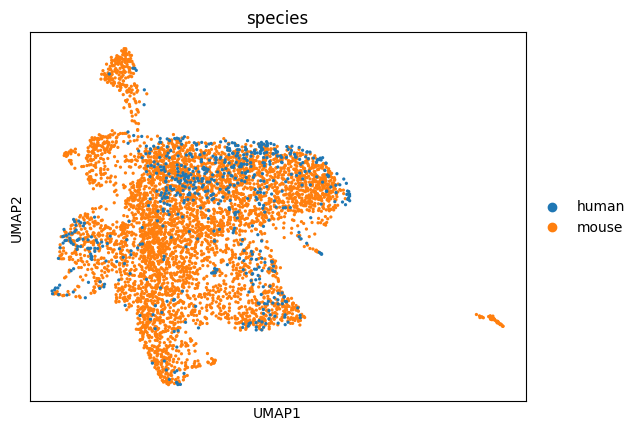

In [ ]:
sc.pl.umap(V1, color = 'species')
# The UMAP representation seems to not separate species

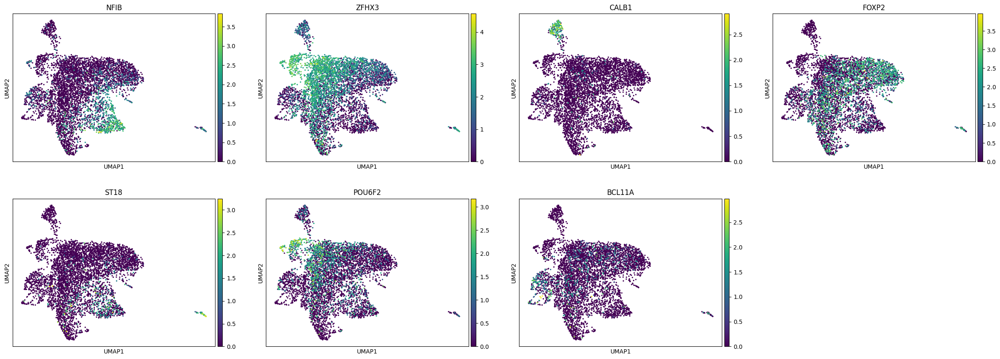

In [ ]:
# Plot the expression of discriminating marker genes
discr_genes =  ['NFIB', 'ZFHX3', 'CALB1', 'FOXP2', 'ST18', 'POU6F2', 'BCL11A']
sc.pl.umap(V1, color = discr_genes)

Using resolution:  0.1


C:\Users\Emile\AppData\Local\Temp\ipykernel_24004\1349033406.py:4: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(V1, resolution=r)


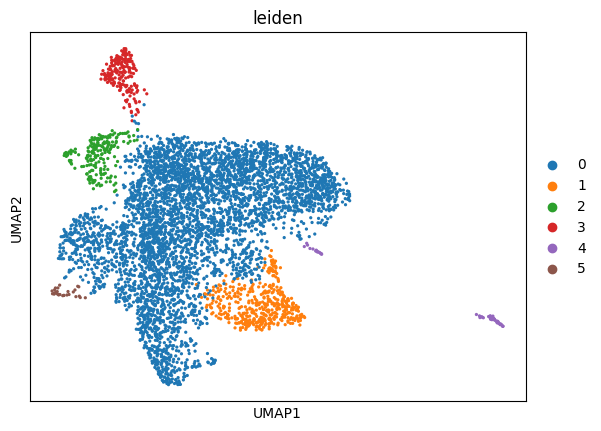

Using resolution:  0.25555555555555554


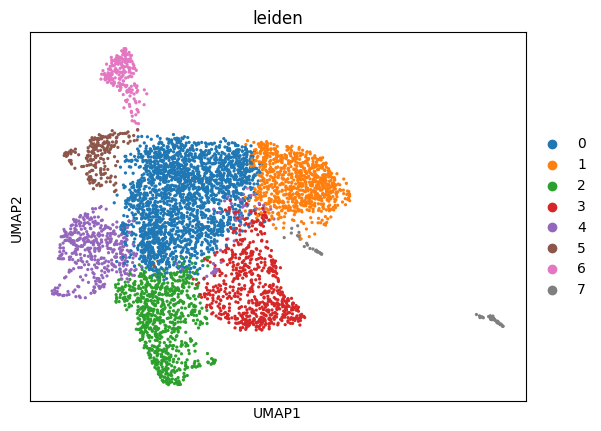

Using resolution:  0.4111111111111111


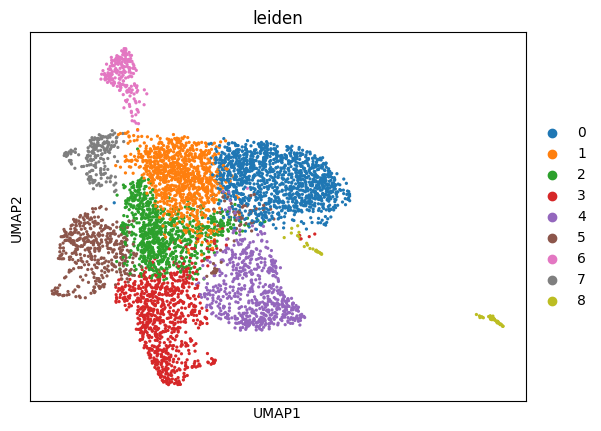

Using resolution:  0.5666666666666667


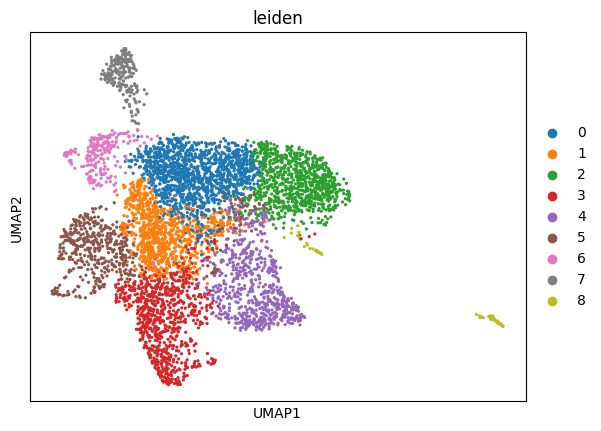

Using resolution:  0.7222222222222222


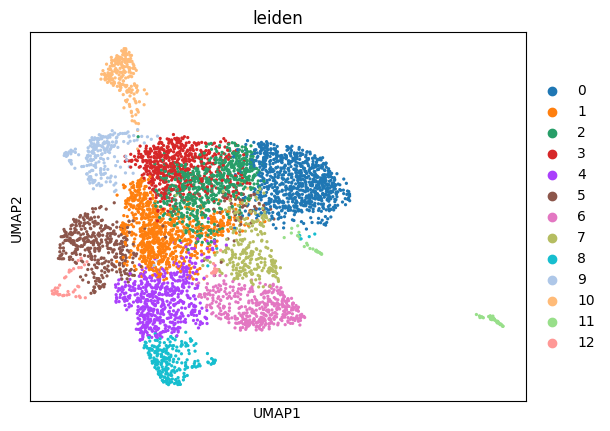

Using resolution:  0.8777777777777778


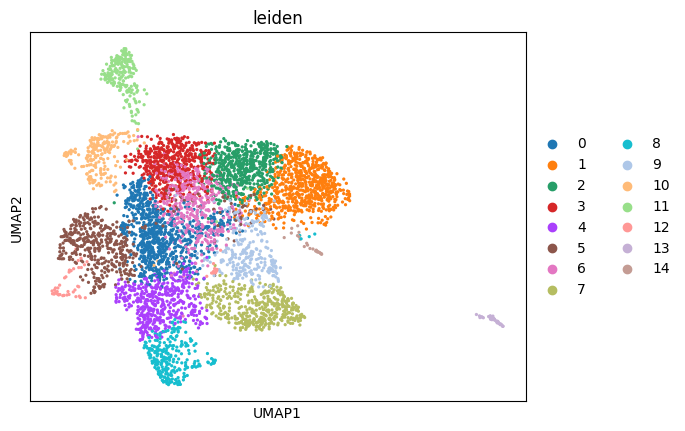

Using resolution:  1.0333333333333334


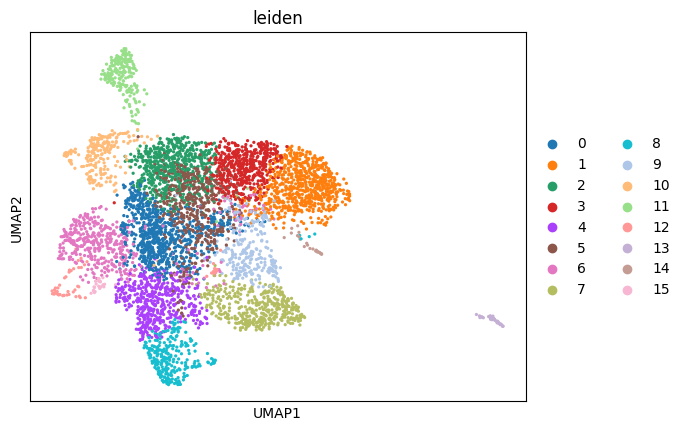

Using resolution:  1.188888888888889


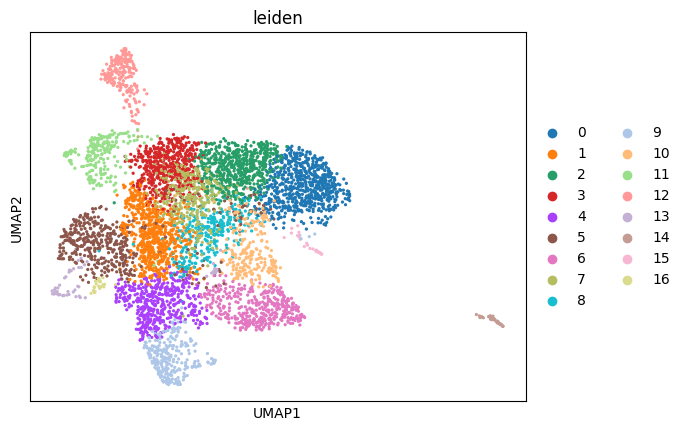

Using resolution:  1.3444444444444446


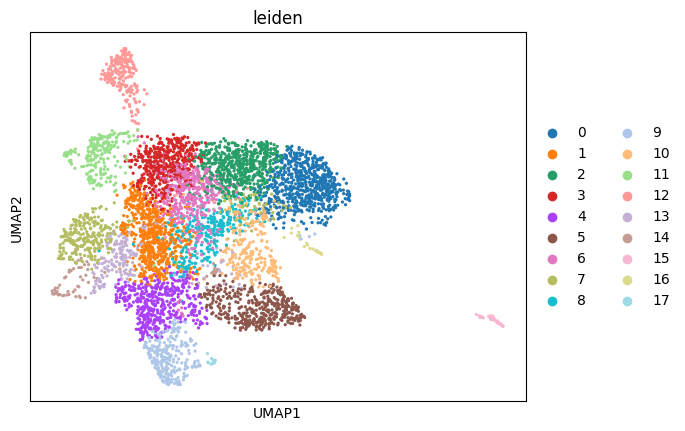

Using resolution:  1.5


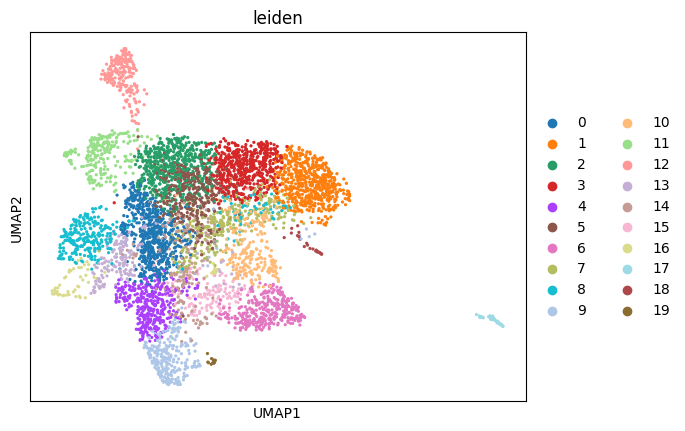

In [ ]:
# Compute clusters for different resolutions, and choose the clustering that fits most the marker genes
resolution = np.linspace(0.1, 1.5, 10)
for r in resolution:
    print('Using resolution: ', r)
    sc.tl.leiden(V1, resolution=r)
    sc.pl.umap(V1, color='leiden')

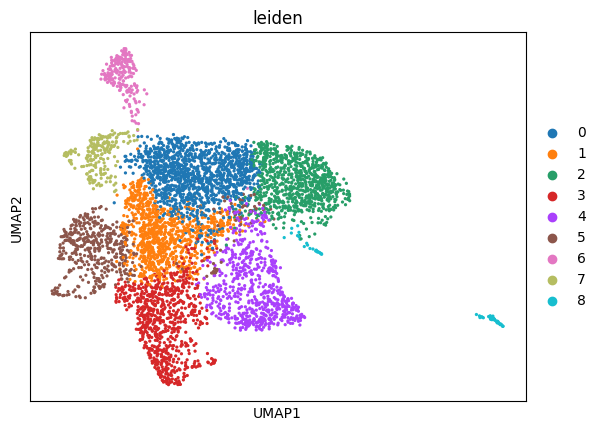

In [14]:
sc.tl.leiden(V1, resolution=0.4)
sc.pl.umap(V1, color = 'leiden')

## Marker exploration

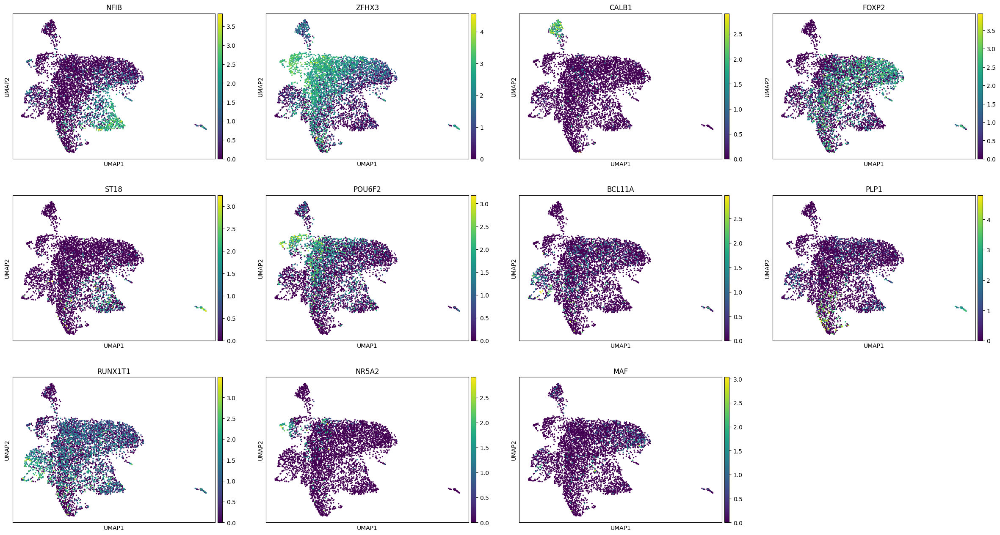

In [15]:
sc.pl.umap(V1, color = discr_genes + ['PLP1'] + ['RUNX1T1'] + ['NR5A2'] + ['MAF'])

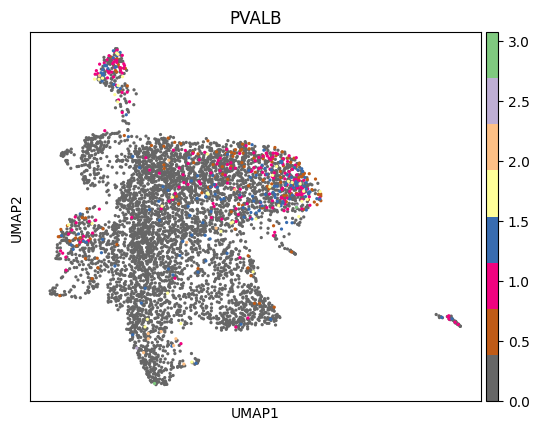

In [16]:
sc.pl.umap(V1, color = 'PVALB', cmap = 'Accent_r')

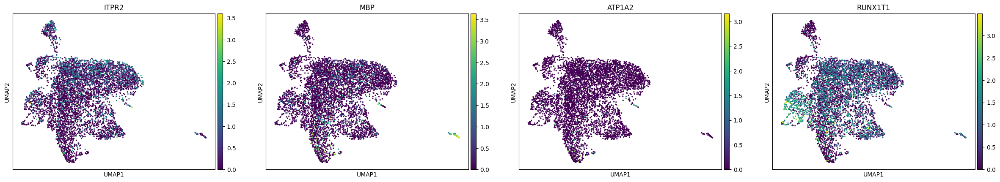

In [17]:
sc.pl.umap(V1, color=['ITPR2', 'MBP', 'ATP1A2', 'RUNX1T1'])

In [18]:
sc.tl.rank_genes_groups(V1, groupby='leiden', method='wilcoxon')

In [19]:
sc.tl.dendrogram(V1, groupby='leiden')

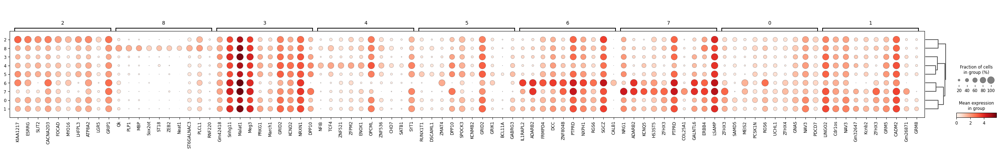

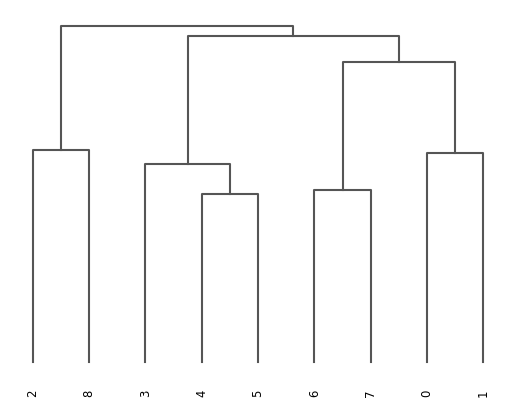

<Axes: >

In [20]:
sc.pl.rank_genes_groups_dotplot(V1)
sc.pl.dendrogram(V1, groupby='leiden')

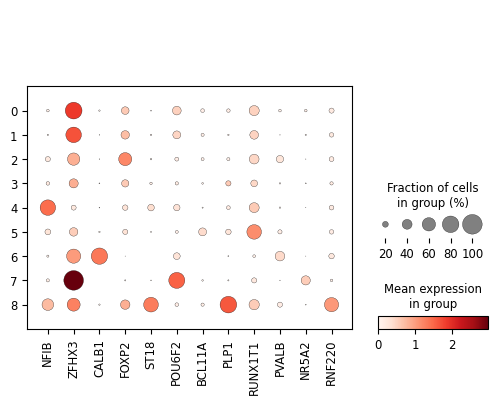

In [21]:
sc.pl.dotplot(V1, var_names=discr_genes + ['PLP1'] + ['RUNX1T1'] + ['PVALB'] + ['NR5A2'] + ['RNF220'], groupby='leiden')

In [22]:
MAFA_TF = ['MAFA', 'RARB', 'TLE4', 'NFIA', 'ONECUT2', 'PPARGC1A', 'ONECUT1']
SP8_TF = ['SP8', 'TSHZ2', 'NPAS3', 'BNC2', 'RORB', 'TSHZ3', 'NFIB', 'TCF4', 'ST18', 'ZFPM2', 'EBF1', 'NFIX', 'EBF3']
POU6F2_TF = ['POU6F2', 'ZFHX3', 'DACH2', 'PBX3', 'POU2F2', 'PBX1', 'NR5A2', 'MAML3']
FOXP2_TF = ['FOXP2', 'FOXP4', 'RUNX1T1', 'PAX2', 'LDB2', 'ARID5B', 'ESRRB', 'CASZ1', 'ESRRG', 'NR3C2', 'DACH1', 'FOXP1', 'MAF']
RNF220_TF = ['PAX8', 'MITF', 'BCL11A', 'TOX', 'BCL11B', 'ZMAT4', 'MAML2']

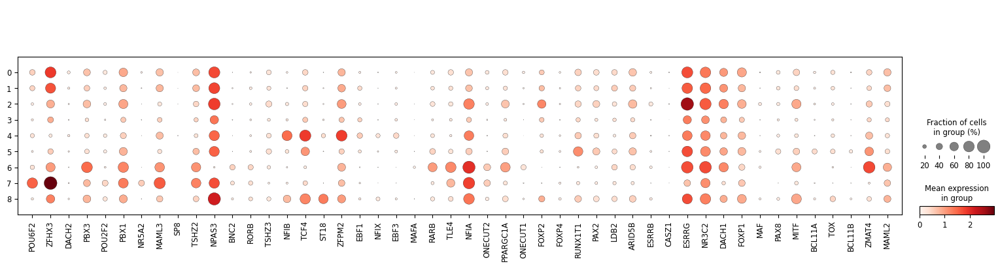

In [23]:
sc.pl.dotplot(V1, POU6F2_TF + SP8_TF + MAFA_TF + FOXP2_TF + RNF220_TF, groupby='leiden', cmap = 'Reds')

## Human neurons

c:\Users\Emile\AppData\Local\Programs\Python\Python313\Lib\site-packages\scanpy\plotting\_utils.py:491: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


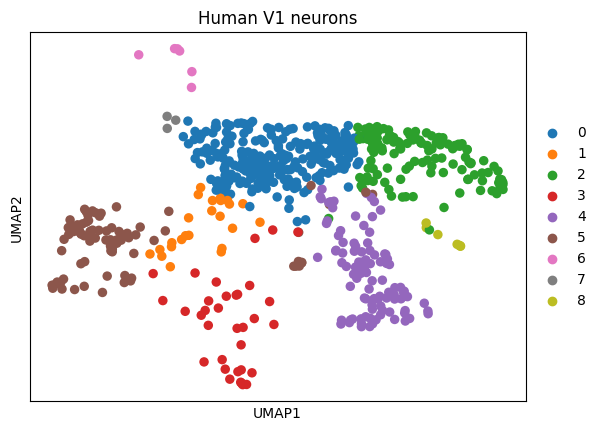

In [24]:
sc.pl.umap(V1[V1.obs['species'] == 'human'], color = 'leiden', title= 'Human V1 neurons')

In [25]:
V1.obs['leiden'].groupby(V1.obs['species']).value_counts()

C:\Users\Emile\AppData\Local\Temp\ipykernel_24004\1210548464.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  V1.obs['leiden'].groupby(V1.obs['species']).value_counts()


species  leiden
human    0          253
         2          134
         4           97
         5           86
         3           34
         1           24
         8            7
         6            6
         7            3
mouse    0         1052
         1          908
         3          739
         2          729
         4          566
         5          402
         7          204
         6          201
         8           59
Name: count, dtype: int64

In [26]:
V1[V1.obs['species'] == 'mouse'].obs['leiden'].value_counts()

leiden
0    1052
1     908
3     739
2     729
4     566
5     402
7     204
6     201
8      59
Name: count, dtype: int64

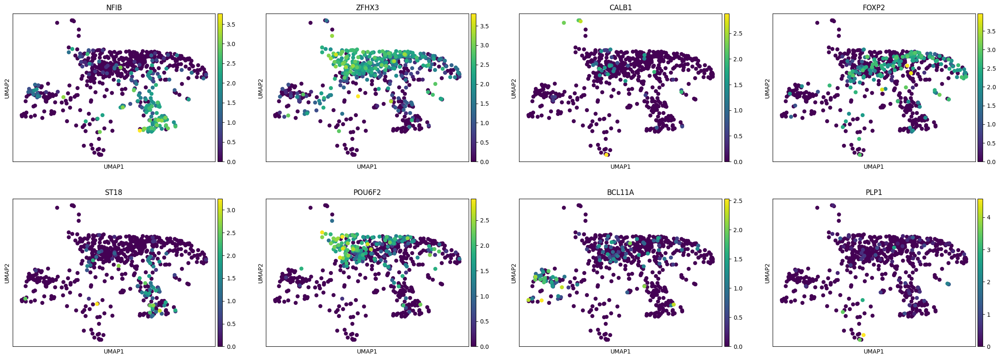

In [27]:
sc.pl.umap(V1[V1.obs['species'] == 'human'], color = discr_genes + ['PLP1'])

## Assignation probability model

### Baseline

In [28]:
for gene in discr_genes:
    print(gene + ': ', sum(V1.obs_vector(gene)>1))

NFIB:  684
ZFHX3:  2427
CALB1:  201
FOXP2:  1606
ST18:  321
POU6F2:  1277
BCL11A:  301


In [29]:
x_markers = []
marker_names = []
for gene in discr_genes : # + ['PLP1'] + ['RUNX1T1']+ ['PVALB'] + ['NR5A2']
    x_markers.append(V1.obs_vector(gene)>1)
    marker_names.append(gene)

In [30]:
x_markers = np.array(x_markers).T.astype(int)
y_leiden = np.array(V1.obs['leiden'].values.astype(int))

In [31]:
x_markers[y_leiden == 1]

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 1, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 1, 0, ..., 0, 0, 0],
       [0, 1, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 1, 0, 0]])

In [32]:
x = {i : x_markers[y_leiden == i] for i in range(9)}
x

{0: array([[0, 0, 0, ..., 0, 0, 0],
        [0, 1, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 1, 0, ..., 0, 1, 0],
        [0, 1, 0, ..., 0, 0, 0],
        [0, 1, 0, ..., 0, 0, 0]]),
 1: array([[0, 0, 0, ..., 0, 0, 0],
        [0, 1, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 1, 0, ..., 0, 0, 0],
        [0, 1, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 1, 0, 0]]),
 2: array([[0, 1, 0, ..., 0, 1, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]]),
 3: array([[0, 1, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]]),
 4: array([[1, 0, 0, ..., 0, 0, 0],
        [1, 0, 0, ..., 0, 0, 0],
        [1, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ...

In [33]:
print(len(x_markers))
print(len(y_leiden))

5504
5504


In [34]:
# from sklearn.preprocessing import StandardScaler
# scaler = StandardScaler()

In [35]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from xgboost import XGBClassifier
X_train, X_test, y_train , y_test = train_test_split(x_markers, y_leiden, test_size=0.2, random_state=1, shuffle=True)

In [36]:
# X_train = scaler.fit_transform(X_train)
# X_test = scaler.fit_transform(X_test)

In [37]:
knn = KNeighborsClassifier(n_neighbors=5)

In [ ]:
knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)
print(accuracy_score(y_pred, y_test))
# Compute global accuracy

0.28610354223433243


In [39]:
knn.classes_

array([0, 1, 2, 3, 4, 5, 6, 7, 8])

In [ ]:
# Compute accuracy score in each class
for i in knn.classes_:
    print(i,accuracy_score(knn.predict(x_markers[y_leiden == i]), y_leiden[y_leiden == i]))

0 0.5295019157088122
1 0.07832618025751073
2 0.21668597914252608
3 0.517464424320828
4 0.3152337858220211
5 0.06352459016393443
6 0.6956521739130435
7 0.04830917874396135
8 0.25757575757575757


In [41]:
knn.predict_proba(x_markers[y_leiden == 7][0:2])

array([[0.4, 0.4, 0. , 0. , 0. , 0. , 0. , 0.2, 0. ],
       [0.4, 0.2, 0.2, 0. , 0. , 0. , 0. , 0.2, 0. ]])

In [42]:
# SVM 
from sklearn.svm import SVC

svm = SVC(C = 1.5, kernel = 'rbf', probability=True)
svm.fit(X_train, y_train)
y_pred_svm = svm.predict(X_test)
print(accuracy_score(y_pred_svm, y_test))

0.3887375113533152


In [ ]:
# Compute accuracy score in each class
for i in svm.classes_:
    print(i,accuracy_score(svm.predict(x_markers[y_leiden == i]), y_leiden[y_leiden == i]))

0 0.7134099616858237
1 0.03862660944206009
2 0.3904982618771727
3 0.40103492884864167
4 0.6199095022624435
5 0.13319672131147542
6 0.6956521739130435
7 0.04830917874396135
8 0.2727272727272727


### Resampling methods for imbalanced dataset classification

In [44]:
from collections import Counter
from sklearn.datasets import make_classification
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

In [45]:
count = Counter(y_leiden)
count

Counter({np.int64(0): 1305,
         np.int64(1): 932,
         np.int64(2): 863,
         np.int64(3): 773,
         np.int64(4): 663,
         np.int64(5): 488,
         np.int64(6): 207,
         np.int64(7): 207,
         np.int64(8): 66})

In [46]:
oversample = SMOTE()
X, y = oversample.fit_resample(x_markers, y_leiden)

In [47]:
count = Counter(y)
count

Counter({np.int64(5): 1305,
         np.int64(0): 1305,
         np.int64(2): 1305,
         np.int64(4): 1305,
         np.int64(3): 1305,
         np.int64(1): 1305,
         np.int64(6): 1305,
         np.int64(7): 1305,
         np.int64(8): 1305})

In [48]:
X_train, X_test, y_train , y_test = train_test_split(X, y, test_size=0.2, random_state=1, shuffle=True)

In [49]:
# scaler = StandardScaler()
# X_train = scaler.fit_transform(X_train)
# X_test = scaler.fit_transform(X_test)

In [50]:
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)

KNeighborsClassifier()

In [51]:
y_pred = knn.predict(X_test)
print(accuracy_score(y_pred, y_test))

0.3776074925500213


In [52]:
accuracy_score(knn.predict(x_markers), y_leiden)

0.27180232558139533

In [53]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_leiden, knn.predict(x_markers))

array([[425, 226, 183, 118,  26,  24,  17, 274,  12],
       [290, 189, 146,  84,  24,  18,   8, 150,  23],
       [108, 138, 194, 307,  37,  30,   3,  24,  22],
       [153,  78, 272, 112,  24,  53,   6,  31,  44],
       [ 54,   6, 103,  32, 132, 213,   0,   3, 120],
       [ 65,  13, 200,  78,   9, 103,   5,   7,   8],
       [ 21,   0,  30,   1,   0,   1, 147,   7,   0],
       [ 44,   5,   0,   2,   0,   0,   0, 153,   3],
       [  4,   1,   1,   6,   8,   3,   0,   2,  41]])

In [54]:
for i in knn.classes_:
    print(i,accuracy_score(knn.predict(x_markers[y_leiden == i]), y_leiden[y_leiden == i]))

0 0.32567049808429116
1 0.20278969957081544
2 0.22479721900347624
3 0.1448900388098318
4 0.19909502262443438
5 0.21106557377049182
6 0.7101449275362319
7 0.7391304347826086
8 0.6212121212121212


In [55]:
# SVM 
from sklearn.svm import SVC

svm = SVC(C = 1.5, kernel = 'rbf', probability=True)
svm.fit(X_train, y_train)
y_pred_svm = svm.predict(X_test)
print(accuracy_score(y_pred_svm, y_test))

0.4495530012771392


In [56]:
accuracy_score(svm.predict(x_markers), y_leiden)

0.3477470930232558

In [57]:
from sklearn.model_selection import cross_val_score
cross_val_score(svm, x_markers, y_leiden)

array([0.39872843, 0.37965486, 0.41598547, 0.40599455, 0.38545455])

In [58]:
svm.predict_proba(x_markers[y_leiden == i])

array([[0.05663678, 0.06240762, 0.0271329 , 0.10166962, 0.06107078,
        0.03681364, 0.01570639, 0.03287108, 0.60569117],
       [0.1027251 , 0.17578837, 0.05922525, 0.17271957, 0.05529368,
        0.32003022, 0.02725222, 0.00713772, 0.07982788],
       [0.04803613, 0.03916161, 0.03481679, 0.06435078, 0.19903189,
        0.04933944, 0.01692805, 0.00772445, 0.54061086],
       [0.06487581, 0.09015245, 0.1140894 , 0.07291609, 0.06172552,
        0.03625952, 0.01770861, 0.01198988, 0.53028273],
       [0.06491682, 0.054974  , 0.06220884, 0.05475729, 0.57550808,
        0.03099898, 0.01322934, 0.00462303, 0.13878361],
       [0.04803613, 0.03916161, 0.03481679, 0.06435078, 0.19903189,
        0.04933944, 0.01692805, 0.00772445, 0.54061086],
       [0.03368101, 0.03719152, 0.07276241, 0.05432751, 0.19745066,
        0.03774068, 0.01352492, 0.00295729, 0.55036401],
       [0.03368101, 0.03719152, 0.07276241, 0.05432751, 0.19745066,
        0.03774068, 0.01352492, 0.00295729, 0.55036401],


In [59]:
svm.predict_proba(x_markers[y_leiden == i])[:,i]>0.3

array([ True, False,  True,  True, False,  True,  True,  True,  True,
       False,  True, False, False,  True,  True,  True,  True, False,
       False,  True,  True,  True,  True,  True, False,  True,  True,
        True,  True,  True, False,  True,  True,  True,  True,  True,
       False,  True,  True, False, False,  True, False,  True,  True,
        True,  True,  True,  True,  True, False,  True,  True,  True,
        True,  True,  True, False, False, False, False, False, False,
       False, False, False])

In [60]:
for i in svm.classes_:
    print(i,accuracy_score(svm.predict_proba(x_markers[y_leiden == i])[:,i]>0.3, y_leiden[y_leiden == i] == i))

0 0.2574712643678161
1 0.06759656652360516
2 0.38122827346465815
3 0.0
4 0.5007541478129713
5 0.5676229508196722
6 0.7101449275362319
7 0.7391304347826086
8 0.6515151515151515


In [61]:
from xgboost import XGBClassifier

xgb = XGBClassifier()
xgb.fit(X_train, y_train)
y_pred_xgb = xgb.predict(X_test)
print(accuracy_score(y_pred_xgb, y_test))

0.4495530012771392


In [62]:
for i in svm.classes_:
    print(i,accuracy_score(xgb.predict_proba(x_markers[y_leiden == i])[:,i]>0.3, y_leiden[y_leiden == i] == i))

0 0.04597701149425287
1 0.06974248927038626
2 0.3823870220162225
3 0.009055627425614488
4 0.6184012066365008
5 0.16598360655737704
6 0.7101449275362319
7 0.7391304347826086
8 0.7121212121212122


In [63]:
svm.predict_proba(x_markers[y_leiden == 7][0:5])

array([[0.15007978, 0.14721222, 0.05871224, 0.07998202, 0.01916812,
        0.02578715, 0.03338657, 0.45783526, 0.02783667],
       [0.31440017, 0.16720784, 0.04243268, 0.09920731, 0.02803025,
        0.04646782, 0.03479541, 0.2133119 , 0.05414664],
       [0.15007978, 0.14721222, 0.05871224, 0.07998202, 0.01916812,
        0.02578715, 0.03338657, 0.45783526, 0.02783667],
       [0.31440017, 0.16720784, 0.04243268, 0.09920731, 0.02803025,
        0.04646782, 0.03479541, 0.2133119 , 0.05414664],
       [0.15007978, 0.14721222, 0.05871224, 0.07998202, 0.01916812,
        0.02578715, 0.03338657, 0.45783526, 0.02783667]])

In [64]:
# Downsample
rus = RandomUnderSampler()
X_down, y_down = rus.fit_resample(x_markers, y_leiden)

In [65]:
Counter(y_down)

Counter({np.int64(0): 66,
         np.int64(1): 66,
         np.int64(2): 66,
         np.int64(3): 66,
         np.int64(4): 66,
         np.int64(5): 66,
         np.int64(6): 66,
         np.int64(7): 66,
         np.int64(8): 66})

In [66]:
X_train, X_test, y_train , y_test = train_test_split(X_down, y_down, test_size=0.2, random_state=1, shuffle=True)

In [67]:
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)

KNeighborsClassifier()

In [68]:
y_pred = knn.predict(X_test)
print(accuracy_score(y_pred, y_test))

0.3025210084033613


In [69]:
accuracy_score(knn.predict(x_markers), y_leiden)

0.31468023255813954

In [70]:
knn.predict_proba(x_markers[y_leiden == 7][0:2])

array([[0.4, 0.2, 0. , 0. , 0. , 0. , 0. , 0.4, 0. ],
       [0.2, 0.2, 0. , 0.2, 0. , 0.2, 0. , 0.2, 0. ]])

### Adding RUNX1T1

In [71]:
for gene in discr_genes+ ['RUNX1T1']:
    print(gene + ': ', sum(V1.obs_vector(gene)>1))

NFIB:  684
ZFHX3:  2427
CALB1:  201
FOXP2:  1606
ST18:  321
POU6F2:  1277
BCL11A:  301
RUNX1T1:  379


In [72]:
x_markers = []
marker_names = []
for gene in discr_genes + ['RUNX1T1'] : # + ['PLP1'] + ['PVALB'] + ['NR5A2']
    x_markers.append(V1.obs_vector(gene)>1)
    marker_names.append(gene)

In [108]:
discr_genes + ['RUNX1T1']

['NFIB', 'ZFHX3', 'CALB1', 'FOXP2', 'ST18', 'POU6F2', 'BCL11A', 'RUNX1T1']

In [73]:
x_markers = np.array(x_markers).T.astype(int)
y_leiden = np.array(V1.obs['leiden'].values.astype(int))

In [74]:
x_markers[y_leiden == 1]

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 1, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 1, 0, ..., 0, 0, 0],
       [0, 1, 0, ..., 0, 0, 1],
       [0, 0, 0, ..., 0, 0, 0]])

In [75]:
x = {i : x_markers[y_leiden == i] for i in range(9)}
x

{0: array([[0, 0, 0, ..., 0, 0, 0],
        [0, 1, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 1, 0, ..., 1, 0, 0],
        [0, 1, 0, ..., 0, 0, 0],
        [0, 1, 0, ..., 0, 0, 0]]),
 1: array([[0, 0, 0, ..., 0, 0, 0],
        [0, 1, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 1, 0, ..., 0, 0, 0],
        [0, 1, 0, ..., 0, 0, 1],
        [0, 0, 0, ..., 0, 0, 0]]),
 2: array([[0, 1, 0, ..., 1, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]]),
 3: array([[0, 1, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 1],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]]),
 4: array([[1, 0, 0, ..., 0, 0, 0],
        [1, 0, 0, ..., 0, 0, 0],
        [1, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ...

In [76]:
print(len(x_markers))
print(len(y_leiden))

5504
5504


In [77]:
# from sklearn.preprocessing import StandardScaler
# scaler = StandardScaler()

In [78]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from xgboost import XGBClassifier
X_train, X_test, y_train , y_test = train_test_split(x_markers, y_leiden, test_size=0.2, random_state=1, shuffle=True)

In [79]:
# X_train = scaler.fit_transform(X_train)
# X_test = scaler.fit_transform(X_test)

In [80]:
knn = KNeighborsClassifier(n_neighbors=5)

In [81]:
knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)
print(accuracy_score(y_pred, y_test))

0.29336966394187103


In [82]:
knn.classes_

array([0, 1, 2, 3, 4, 5, 6, 7, 8])

In [83]:
for i in knn.classes_:
    print(i,accuracy_score(knn.predict(x_markers[y_leiden == i]), y_leiden[y_leiden == i]))

0 0.5486590038314176
1 0.08690987124463519
2 0.21552723059096177
3 0.49547218628719275
4 0.33634992458521873
5 0.07991803278688525
6 0.6956521739130435
7 0.04830917874396135
8 0.19696969696969696


In [84]:
knn.predict_proba(x_markers[y_leiden == 7][0:2])

array([[0.4, 0.4, 0. , 0. , 0. , 0. , 0. , 0.2, 0. ],
       [0.4, 0.2, 0.2, 0. , 0. , 0. , 0. , 0.2, 0. ]])

In [85]:
# SVM 
from sklearn.svm import SVC

svm = SVC(C = 1.5, kernel = 'rbf', probability=True)
svm.fit(X_train, y_train)
y_pred_svm = svm.predict(X_test)
print(accuracy_score(y_pred_svm, y_test))

0.3941871026339691


In [86]:
for i in svm.classes_:
    print(i,accuracy_score(svm.predict(x_markers[y_leiden == i]), y_leiden[y_leiden == i]))

0 0.7042145593869732
1 0.043991416309012876
2 0.38122827346465815
3 0.37257438551099614
4 0.6304675716440422
5 0.29713114754098363
6 0.6956521739130435
7 0.04830917874396135
8 0.2727272727272727


In [87]:
from collections import Counter
from sklearn.datasets import make_classification
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

In [88]:
count = Counter(y_leiden)
count

Counter({np.int64(0): 1305,
         np.int64(1): 932,
         np.int64(2): 863,
         np.int64(3): 773,
         np.int64(4): 663,
         np.int64(5): 488,
         np.int64(6): 207,
         np.int64(7): 207,
         np.int64(8): 66})

In [89]:
oversample = SMOTE()
X, y = oversample.fit_resample(x_markers, y_leiden)

In [90]:
count = Counter(y)
count

Counter({np.int64(5): 1305,
         np.int64(0): 1305,
         np.int64(2): 1305,
         np.int64(4): 1305,
         np.int64(3): 1305,
         np.int64(1): 1305,
         np.int64(6): 1305,
         np.int64(7): 1305,
         np.int64(8): 1305})

In [91]:
X_train, X_test, y_train , y_test = train_test_split(X, y, test_size=0.2, random_state=1, shuffle=True)

In [92]:
# scaler = StandardScaler()
# X_train = scaler.fit_transform(X_train)
# X_test = scaler.fit_transform(X_test)

In [93]:
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)

KNeighborsClassifier()

In [94]:
y_pred = knn.predict(X_test)
print(accuracy_score(y_pred, y_test))

0.4001702852277565


In [95]:
accuracy_score(knn.predict(x_markers), y_leiden)

0.3359375

In [96]:
for i in knn.classes_:
    print(i,accuracy_score(knn.predict(x_markers[y_leiden == i]), y_leiden[y_leiden == i]))

0 0.5126436781609195
1 0.21030042918454936
2 0.013904982618771726
3 0.11901681759379043
4 0.6063348416289592
5 0.29713114754098363
6 0.7101449275362319
7 0.7198067632850241
8 0.5606060606060606


In [97]:
# SVM 
from sklearn.svm import SVC

svm = SVC(C = 1.5, kernel = 'rbf', probability=True)
svm.fit(X_train, y_train)
y_pred_svm = svm.predict(X_test)
print(accuracy_score(y_pred_svm, y_test))

0.45891868880374626


In [98]:
accuracy_score(svm.predict(x_markers), y_leiden)

0.3757267441860465

In [99]:
from sklearn.model_selection import cross_val_score
cross_val_score(svm, x_markers, y_leiden)

array([0.40690282, 0.38419619, 0.41144414, 0.41416894, 0.39272727])

In [100]:
svm.predict_proba(x_markers[y_leiden == i])[:,i]>0.3

array([ True, False,  True,  True,  True,  True,  True,  True,  True,
       False,  True, False, False,  True,  True,  True,  True, False,
       False,  True,  True,  True,  True,  True, False,  True,  True,
        True,  True,  True, False,  True,  True,  True,  True,  True,
       False,  True,  True, False, False,  True, False,  True,  True,
        True,  True, False,  True,  True, False,  True,  True,  True,
        True,  True,  True, False, False, False, False, False, False,
       False, False, False])

In [101]:
for i in svm.classes_:
    print(i,accuracy_score(svm.predict_proba(x_markers[y_leiden == i])[:,i]>0.3, y_leiden[y_leiden == i] == i))

0 0.29042145593869734
1 0.194206008583691
2 0.36964078794901506
3 0.0
4 0.583710407239819
5 0.32991803278688525
6 0.7101449275362319
7 0.7391304347826086
8 0.6515151515151515


In [102]:
from xgboost import XGBClassifier

xgb = XGBClassifier()
xgb.fit(X_train, y_train)
y_pred_xgb = xgb.predict(X_test)
print(accuracy_score(y_pred_xgb, y_test))

0.4593444018731375


In [103]:
cross_val_score(xgb, x_markers, y_leiden)

array([0.40962761, 0.38692098, 0.41144414, 0.41326067, 0.39      ])

In [104]:
for i in svm.classes_:
    print(i,accuracy_score(xgb.predict_proba(x_markers[y_leiden == i])[:,i]>0.3, y_leiden[y_leiden == i] == i))

0 0.06283524904214559
1 0.2628755364806867
2 0.3707995365005794
3 0.02199223803363519
4 0.6123680241327301
5 0.35655737704918034
6 0.7101449275362319
7 0.7391304347826086
8 0.696969696969697


In [105]:
svm.predict_proba(x_markers[y_leiden == 7][0:5])

array([[0.17830234, 0.15924469, 0.03538729, 0.05418832, 0.01455586,
        0.02374118, 0.05769644, 0.44406659, 0.03281729],
       [0.31939246, 0.18621273, 0.04872336, 0.09958759, 0.02437634,
        0.0341733 , 0.04855676, 0.18411258, 0.05486488],
       [0.17830234, 0.15924469, 0.03538729, 0.05418832, 0.01455586,
        0.02374118, 0.05769644, 0.44406659, 0.03281729],
       [0.31939246, 0.18621273, 0.04872336, 0.09958759, 0.02437634,
        0.0341733 , 0.04855676, 0.18411258, 0.05486488],
       [0.17830234, 0.15924469, 0.03538729, 0.05418832, 0.01455586,
        0.02374118, 0.05769644, 0.44406659, 0.03281729]])

In [ ]:
# Save model
xgb.save_model('models/cluster_assignation_probability_model.json')

### Downsampling method

In [208]:
# Downsample
rus = RandomUnderSampler()
X_down, y_down = rus.fit_resample(x_markers, y_leiden)

In [209]:
Counter(y_down)

Counter({np.int64(0): 66,
         np.int64(1): 66,
         np.int64(2): 66,
         np.int64(3): 66,
         np.int64(4): 66,
         np.int64(5): 66,
         np.int64(6): 66,
         np.int64(7): 66,
         np.int64(8): 66})

In [210]:
X_train, X_test, y_train , y_test = train_test_split(X_down, y_down, test_size=0.2, random_state=1, shuffle=True)

In [211]:
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)

KNeighborsClassifier()

In [212]:
y_pred = knn.predict(X_test)
print(accuracy_score(y_pred, y_test))

0.3445378151260504


In [213]:
accuracy_score(knn.predict(x_markers), y_leiden)

0.359375

In [214]:
knn.predict_proba(x_markers[y_leiden == 7][0:2])

array([[0.4, 0. , 0. , 0.2, 0. , 0. , 0. , 0.4, 0. ],
       [0.4, 0.2, 0. , 0.2, 0. , 0. , 0.2, 0. , 0. ]])

### Marker analysis through feature importance analysis

In [215]:
svm_all_features = SVC()
X_train, X_test, y_train , y_test = train_test_split(np.array(V1.X>1), y_leiden, test_size=0.2, random_state=1, shuffle=True)
svm_all_features.fit(X_train, y_train)

KeyboardInterrupt: 

In [ ]:
X_test

array([[ True, False, False, ..., False, False, False],
       [ True, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [ True, False, False, ..., False, False, False]])

In [ ]:
accuracy_score(svm_all_features.predict(X_test), y_test )

0.7929155313351499

In [ ]:
from xgboost import XGBClassifier

xgb = XGBClassifier()
xgb.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

In [82]:
y_pred_xgb = xgb.predict(X_test)
print(accuracy_score(y_pred_xgb, y_test))

0.7520435967302452


In [83]:
t = np.argsort(xgb.feature_importances_)[-50:]

In [84]:
xgb_discr_genes = V1.var_names[t]

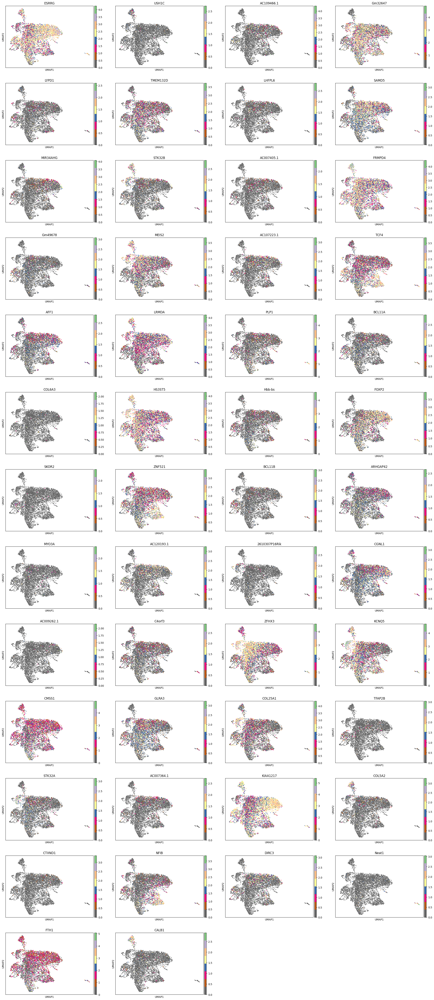

In [101]:
sc.pl.umap(V1, color = xgb_discr_genes, cmap = 'Accent_r')

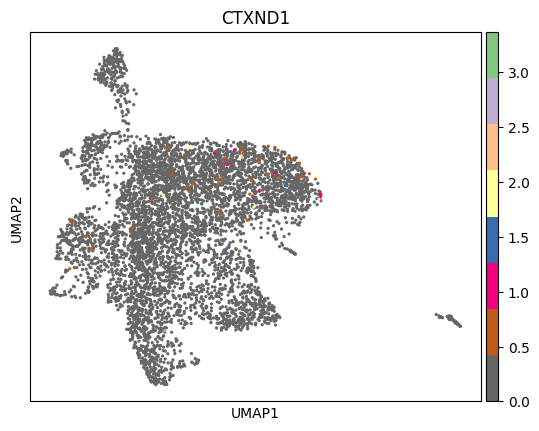

In [102]:
sc.pl.umap(V1, color = 'CTXND1', cmap = 'Accent_r')

In [87]:
df_tree = xgb.get_booster().trees_to_dataframe()

In [88]:
df_tree

,Tree,Node,ID,Feature,Split,Yes,No,Missing,Gain,Cover,Category
0,0,0,0-0,f724,1.0,0-1,0-2,0-2,321.362976,869.728394,NaN
1,0,1,0-1,f836,1.0,0-3,0-4,0-4,52.579010,491.851868,NaN
2,0,2,0-2,f836,1.0,0-5,0-6,0-6,106.139282,377.876556,NaN
3,0,3,0-3,f491,1.0,0-7,0-8,0-8,19.070250,295.901245,NaN
4,0,4,0-4,f356,1.0,0-9,0-10,0-10,34.872414,195.950623,NaN
...,...,...,...,...,...,...,...,...,...,...,...
37759,897,2,897-2,Leaf,NaN,NaN,NaN,NaN,0.017452,1.146703,NaN
37760,898,0,898-0,f553,1.0,898-1,898-2,898-2,0.013974,2.654393,NaN
37761,898,1,898-1,Leaf,NaN,NaN,NaN,NaN,-0.012318,1.449720,NaN
37762,898,2,898-2,Leaf,NaN,NaN,NaN,NaN,0.020792,1.204673,NaN


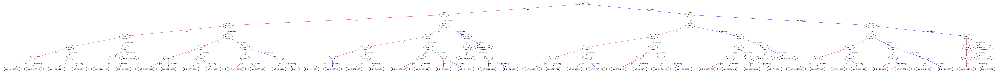

In [97]:
from xgboost import plot_tree, plot_importance
fig, ax = plt.subplots(1,1, figsize = (100,100))
plot_tree(xgb.get_booster(), ax=ax)
plt.show()

### Lime

In [ ]:
from lime.lime_tabular import LimeTabularExplainer

explainer = LimeTabularExplainer(training_data= X_train.astype(int), feature_names = V1.var_names)

In [100]:
exp = explainer.explain_instance(data_row = X_test, predict_fn = xgb.predict_proba)

NameError: name 'explainer' is not defined

In [ ]:
exp.as_list()

[('FAS <= 0.00', -0.31038090138412494),
 ('AC105213.1 <= 0.00', -0.2691059434827422),
 ('Siglech <= 0.00', -0.15928429252380238),
 ('MEOX1 <= 0.00', -0.12869910128605705),
 ('LINC02237 <= 0.00', 0.1101223217004434),
 ('IGFN1 <= 0.00', -0.060454020931655354),
 ('VIP <= 0.00', -0.05976269820161442),
 ('AC021594.2 <= 0.00', 0.04292271148840589),
 ('UNC5CL <= 0.00', 0.041719454052808004),
 ('ALDH1A1 <= 0.00', -0.011132809938457477)]

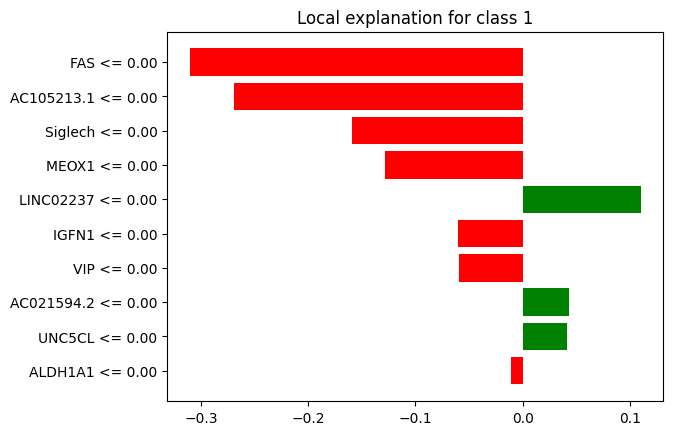

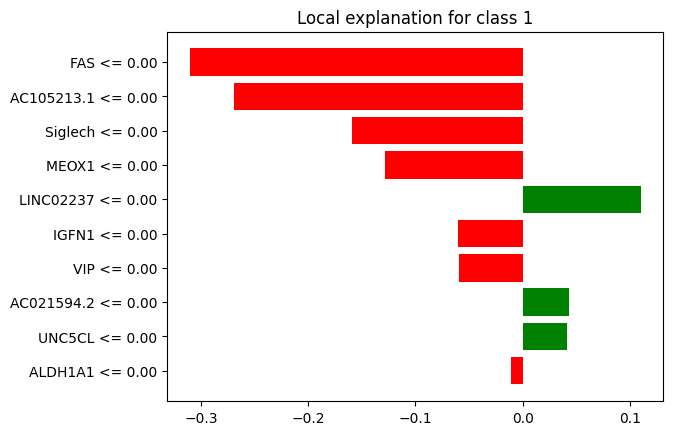

In [ ]:
exp.as_pyplot_figure()

### Trees

In [99]:
xgb.get_booster().get_dump()

['0:[f724<1] yes=1,no=2,missing=2\n\t1:[f836<1] yes=3,no=4,missing=4\n\t\t3:[f491<1] yes=7,no=8,missing=8\n\t\t\t7:[f1850<1] yes=15,no=16,missing=16\n\t\t\t\t15:[f1406<1] yes=31,no=32,missing=32\n\t\t\t\t\t31:[f1159<1] yes=59,no=60,missing=60\n\t\t\t\t\t\t59:leaf=-0.114307322\n\t\t\t\t\t\t60:leaf=0.194754109\n\t\t\t\t\t32:[f63<1] yes=61,no=62,missing=62\n\t\t\t\t\t\t61:leaf=-0.0442622975\n\t\t\t\t\t\t62:leaf=0.405699521\n\t\t\t\t16:[f56<1] yes=33,no=34,missing=34\n\t\t\t\t\t33:[f176<1] yes=63,no=64,missing=64\n\t\t\t\t\t\t63:leaf=-0.123934433\n\t\t\t\t\t\t64:leaf=0.183050841\n\t\t\t\t\t34:leaf=0.477990448\n\t\t\t8:[f193<1] yes=17,no=18,missing=18\n\t\t\t\t17:[f39<1] yes=35,no=36,missing=36\n\t\t\t\t\t35:[f1241<1] yes=65,no=66,missing=66\n\t\t\t\t\t\t65:leaf=-0.0965185016\n\t\t\t\t\t\t66:leaf=0.119833566\n\t\t\t\t\t36:[f1548<1] yes=67,no=68,missing=68\n\t\t\t\t\t\t67:leaf=0.0574468113\n\t\t\t\t\t\t68:leaf=0.546303511\n\t\t\t\t18:[f296<1] yes=37,no=38,missing=38\n\t\t\t\t\t37:[f268<1] ye